In [66]:
import pickle

with open("../demo/ntu60_2d.pkl", 'rb') as f: 
    data = pickle.load(f)

data

{'split': {'xsub_train': ['S001C001P001R001A001',
   'S001C001P001R001A002',
   'S001C001P001R001A003',
   'S001C001P001R001A004',
   'S001C001P001R001A005',
   'S001C001P001R001A006',
   'S001C001P001R001A007',
   'S001C001P001R001A008',
   'S001C001P001R001A009',
   'S001C001P001R001A010',
   'S001C001P001R001A011',
   'S001C001P001R001A012',
   'S001C001P001R001A013',
   'S001C001P001R001A014',
   'S001C001P001R001A015',
   'S001C001P001R001A016',
   'S001C001P001R001A017',
   'S001C001P001R001A018',
   'S001C001P001R001A019',
   'S001C001P001R001A020',
   'S001C001P001R001A021',
   'S001C001P001R001A022',
   'S001C001P001R001A023',
   'S001C001P001R001A024',
   'S001C001P001R001A025',
   'S001C001P001R001A026',
   'S001C001P001R001A027',
   'S001C001P001R001A028',
   'S001C001P001R001A029',
   'S001C001P001R001A030',
   'S001C001P001R001A031',
   'S001C001P001R001A032',
   'S001C001P001R001A033',
   'S001C001P001R001A034',
   'S001C001P001R001A035',
   'S001C001P001R001A036',
   'S

In [3]:
with open("../data\grossmotor-pose\center-1_gallop_1_1.pkl", 'rb') as f: 
    data = pickle.load(f)

data

{'keypoint': array([[[[286.40085, 436.90222],
          [291.9524 , 420.24756],
          [275.29776, 420.24756],
          ...,
          [297.50394, 758.89197],
          [ 86.54512, 881.02606],
          [275.29776, 897.68066]],
 
         [[305.52505, 444.24158],
          [305.52505, 433.51862],
          [294.80206, 433.51862],
          ...,
          [316.24802, 760.5691 ],
          [ 96.4272 , 878.5217 ],
          [273.35614, 899.96765]],
 
         [[323.6366 , 442.585  ],
          [318.30948, 431.93076],
          [307.65527, 431.93076],
          ...,
          [334.29083, 767.5389 ],
          [105.22496, 879.40826],
          [275.6926 , 900.71674]],
 
         ...,
 
         [[832.51746, 377.70578],
          [832.51746, 366.2594 ],
          [821.07104, 360.53622],
          ...,
          [792.45514, 732.5433 ],
          [763.83923, 835.5606 ],
          [775.2856 , 841.2838 ]],
 
         [[849.87463, 375.0643 ],
          [849.87463, 363.40445],
          [844.0

In [54]:
from pathlib import Path
import pickle
from sklearn.model_selection import train_test_split
from constants import globals as g

# Function to load and combine pickle files from a directory
def combine_pickles_from_directory(directory: Path):
    combined_data = {
        'split': {'train': [], 'val': []}, 
        'annotations': [],
                     }
    
    # Iterate through files in the directory
    video_files = list(directory.iterdir())

    train_data, val_data = train_test_split(
        video_files, test_size=0.2, random_state=42
    )

    for video_file in train_data:
        with open(video_file, 'rb') as f:
            data = pickle.load(f)
            # print(data)
            combined_data['split']['train'].append(data['frame_dir'])
            combined_data['annotations'].append(data)
            

    for video_file in val_data:
        with open(video_file, 'rb') as f:
            data = pickle.load(f)
            # print(data)
            combined_data['split']['val'].append(data['frame_dir'])
            combined_data['annotations'].append(data)

    # combined_data['annotations'] = {key: combined_data['annotations'][key] for key in desired_key_arrangement if key in combined_data['annotations']}
    return combined_data

In [55]:
data = combine_pickles_from_directory(g.GROSSMOTOR_DIR_PK)

In [59]:
desired_key_arrangement = ['frame_dir', 'label', 'img_shape', 'original_shape', 'total_frames', 'keypoint', 'keypoint_score']
data['annotations'][0] = {key: data['annotations'][0][key] for key in desired_key_arrangement if key in data['annotations'][0]}

In [61]:
data['annotations']

[{'frame_dir': 'center-4_slide_2_1',
  'label': 6,
  'img_shape': (1080, 1920),
  'original_shape': (1080, 1920),
  'total_frames': 30,
  'keypoint': array([[[[151.21217, 425.37485],
           [162.54663, 414.04037],
           [134.21048, 419.7076 ],
           ...,
           [151.21217, 759.74146],
           [264.5568 , 867.4188 ],
           [179.54832, 873.08606]],
  
          [[156.50624, 431.4581 ],
           [167.51118, 420.45316],
           [139.99884, 420.45316],
           ...,
           [156.50624, 761.6062 ],
           [288.5655 , 866.1531 ],
           [178.51613, 871.6556 ]],
  
          [[164.1155 , 436.65924],
           [174.93105, 420.4359 ],
           [147.89217, 425.8437 ],
           ...,
           [164.1155 , 771.94135],
           [315.53323, 869.2813 ],
           [180.33882, 874.6891 ]],
  
          ...,
  
          [[406.9486 , 439.93704],
           [417.75845, 423.72226],
           [396.13876, 434.5321 ],
           ...,
           [379.92398, 

In [67]:
with open("../data/grossmotor-pose-combined/grossmotor_2d.pkl", 'rb') as f: 
    data = pickle.load(f)

data['annotations'][0].shape

AttributeError: 'dict' object has no attribute 'shape'

In [77]:
data['annotations'][2]

{'keypoint': array([[[[ 24.955006, 390.82135 ],
          [ 34.92792 , 380.84842 ],
          [ 14.982087, 380.84842 ],
          ...,
          [  9.995627, 724.9141  ],
          [ 34.92792 , 819.6568  ],
          [ 14.982087, 819.6568  ]],
 
         [[ 27.57808 , 392.04135 ],
          [ 37.54674 , 382.07266 ],
          [ 17.609417, 382.07266 ],
          ...,
          [ 12.625086, 725.9915  ],
          [ 37.54674 , 820.6938  ],
          [ 17.609417, 820.6938  ]],
 
         [[ 27.3356  , 392.9489  ],
          [ 32.311703, 382.9967  ],
          [ 12.407285, 382.9967  ],
          ...,
          [ 12.407285, 726.34796 ],
          [ 37.287807, 820.8939  ],
          [ 17.38339 , 820.8939  ]],
 
         ...,
 
         [[ 20.867886, 393.1846  ],
          [ 30.8347  , 383.2178  ],
          [ 10.901071, 378.23438 ],
          ...,
          [ 10.901071, 727.07294 ],
          [ 35.818108, 821.7576  ],
          [ 15.884478, 821.7576  ]],
 
         [[ 26.688715, 390.43417 ],


In [64]:
len(data['split']['train'])

245

In [65]:
len(data['split']['val'])

62

In [2]:
import pickle

with open("../data/grossmotor-pose-v2/center-1_gallop_1_1.pkl", 'rb') as f: 
    data = pickle.load(f)

data

{'keypoint': array([[[[ 286.40085 ,  436.90222 ],
          [ 291.9524  ,  420.24756 ],
          [ 275.29776 ,  420.24756 ],
          ...,
          [ 297.50394 ,  758.89197 ],
          [  86.54513 ,  881.02606 ],
          [ 275.29776 ,  897.68066 ]],
 
         [[ 305.52505 ,  444.24158 ],
          [ 305.52505 ,  433.51862 ],
          [ 294.8021  ,  433.51862 ],
          ...,
          [ 316.24802 ,  760.5691  ],
          [  96.4272  ,  878.5217  ],
          [ 273.35614 ,  899.96765 ]],
 
         [[ 323.6366  ,  442.58496 ],
          [ 318.30948 ,  431.93073 ],
          [ 307.65524 ,  431.93073 ],
          ...,
          [ 334.29083 ,  767.5389  ],
          [ 105.22496 ,  879.40826 ],
          [ 275.69257 ,  900.7167  ]],
 
         ...,
 
         [[  73.80039 ,  390.79492 ],
          [  84.03942 ,  380.5559  ],
          [  58.441853,  380.5559  ],
          ...,
          [  12.366227,  733.80237 ],
          [ 140.35408 ,  831.0731  ],
          [  17.48574 ,  836.

In [3]:
with open("../data\grossmotor-pose\center-1_gallop_1_1.pkl", 'rb') as f: 
    data = pickle.load(f)

data

{'keypoint': array([[[[286.40085, 436.90222],
          [291.9524 , 420.24756],
          [275.29776, 420.24756],
          ...,
          [297.50394, 758.89197],
          [ 86.54512, 881.02606],
          [275.29776, 897.68066]],
 
         [[305.52505, 444.24158],
          [305.52505, 433.51862],
          [294.80206, 433.51862],
          ...,
          [316.24802, 760.5691 ],
          [ 96.4272 , 878.5217 ],
          [273.35614, 899.96765]],
 
         [[323.6366 , 442.585  ],
          [318.30948, 431.93076],
          [307.65527, 431.93076],
          ...,
          [334.29083, 767.5389 ],
          [105.22496, 879.40826],
          [275.6926 , 900.71674]],
 
         ...,
 
         [[832.51746, 377.70578],
          [832.51746, 366.2594 ],
          [821.07104, 360.53622],
          ...,
          [792.45514, 732.5433 ],
          [763.83923, 835.5606 ],
          [775.2856 , 841.2838 ]],
 
         [[849.87463, 375.0643 ],
          [849.87463, 363.40445],
          [844.0

In [2]:
import pickle

with open("../../data/grossmotor-pose-combined/grossmotor_2d_v2.pkl", 'rb') as f: 
    data = pickle.load(f)

data

{'split': {'train': ['center-4_slide_2_1',
   'center-3_leap_1_1',
   'center-5_gallop_1_3',
   'center-2_hop_2_4',
   'center-2_slide_1_8',
   'center-1_slide_2_9',
   'center-4_slide_2_8',
   'center-1_gallop_2_1',
   'center-3_slide_2_6',
   'center-1_run_1_3',
   'center-1_leap_1_3',
   'center-5_hop_1_2',
   'center-1_slide_2_6',
   'center-3_hop_1_2',
   'center-3_leap_1_4',
   'center-5_slide_1_1',
   'center-4_slide_2_11',
   'center-4_leap_1_1',
   'center-4_skip_1_3',
   'center-5_leap_2_2',
   'center-4_skip_2_3',
   'center-2_slide_2_10',
   'center-2_gallop_2_2',
   'center-2_slide_1_9',
   'center-5_skip_1_1',
   'center-2_run_2_3',
   'center-1_jump_2_1',
   'center-3_leap_1_3',
   'center-2_leap_1_1',
   'center-4_hop_1_3',
   'center-3_gallop_1_1',
   'center-2_hop_1_3',
   'center-1_hop_2_1',
   'center-1_gallop_2_5',
   'center-3_skip_2_2',
   'center-2_slide_1_3',
   'center-2_skip_1_5',
   'center-2_gallop_2_4',
   'center-5_skip_2_2',
   'center-1_skip_1_4',
   'c

In [14]:
print(f"train data: {len(data['split']['train'])}")
print(f"val data: {len(data['split']['val'])}")

train data: 245
val data: 62


In [4]:
data['annotations'][0]['keypoint'].shape

(2, 30, 17, 2)

## Visualize

In [1]:
import os
import cv2
import os.path as osp
import decord
import numpy as np
import matplotlib.pyplot as plt
import urllib
import moviepy.editor as mpy
import random as rd
from mmpose.apis import vis_pose_result
from mmpose.models import TopDown
from mmcv import load, dump

from constants import globals as g

In [2]:
gm_annot = os.path.join(g.GROSSMOTOR_DIR_PK_COMBINED.__str__(), "grossmotor_2d_v2.pkl")

In [3]:
FONTFACE = cv2.FONT_HERSHEY_DUPLEX
FONTSCALE = 0.6
FONTCOLOR = (255, 255, 255)
BGBLUE = (0, 119, 182)
THICKNESS = 1
LINETYPE = 1

In [4]:
def add_label(frame, label, BGCOLOR=BGBLUE):
    threshold = 30
    def split_label(label):
        label = label.split()
        lines, cline = [], ''
        for word in label:
            if len(cline) + len(word) < threshold:
                cline = cline + ' ' + word
            else:
                lines.append(cline)
                cline = word
        if cline != '':
            lines += [cline]
        return lines
    
    if len(label) > 30:
        label = split_label(label)
    else:
        label = [label]
    label = ['Action: '] + label
    
    sizes = []
    for line in label:
        sizes.append(cv2.getTextSize(line, FONTFACE, FONTSCALE, THICKNESS)[0])
    box_width = max([x[0] for x in sizes]) + 10
    text_height = sizes[0][1]
    box_height = len(sizes) * (text_height + 6)
    
    cv2.rectangle(frame, (0, 0), (box_width, box_height), BGCOLOR, -1)
    for i, line in enumerate(label):
        location = (5, (text_height + 6) * i + text_height + 3)
        cv2.putText(frame, line, location, FONTFACE, FONTSCALE, FONTCOLOR, THICKNESS, LINETYPE)
    return frame

def vis_skeleton(vid_path, anno, category_name=None, ratio=0.5):
    vid = decord.VideoReader(vid_path)
    frames = [x.asnumpy() for x in vid]
    
    h, w, _ = frames[0].shape
    new_shape = (int(w * ratio), int(h * ratio))
    frames = [cv2.resize(f, new_shape) for f in frames]
    
    assert len(frames) == anno['total_frames']
    # The shape is N x T x K x 3
    kps = np.concatenate([anno['keypoint'], anno['keypoint_score'][..., None]], axis=-1)
    kps[..., :2] *= ratio
    # Convert to T x N x K x 3
    kps = kps.transpose([1, 0, 2, 3])
    vis_frames = []

    # we need an instance of TopDown model, so build a minimal one
    model = TopDown(backbone=dict(type='ShuffleNetV1'))

    for f, kp in zip(frames, kps):
        result = [dict(keypoints=k) for k in kp]
        vis_frame = vis_pose_result(model, f, result)
        
        if category_name is not None:
            vis_frame = add_label(vis_frame, category_name)
        
        vis_frames.append(vis_frame)
    return vis_frames

In [5]:
keypoint_pipeline = [
    dict(type='PoseDecode'),
    dict(type='PoseCompact', hw_ratio=1., allow_imgpad=True),
    dict(type='Resize', scale=(-1, 64)),
    dict(type='CenterCrop', crop_size=64),
    dict(type='GeneratePoseTarget', sigma=0.6, use_score=True, with_kp=True, with_limb=False)
]

limb_pipeline = [
    dict(type='PoseDecode'),
    dict(type='PoseCompact', hw_ratio=1., allow_imgpad=True),
    dict(type='Resize', scale=(-1, 64)),
    dict(type='CenterCrop', crop_size=64),
    dict(type='GeneratePoseTarget', sigma=0.6, use_score=True, with_kp=False, with_limb=True)
]

In [7]:
from mmaction2.mmaction.datasets.pipelines import Compose
def get_pseudo_heatmap(anno, flag='keypoint'):
    assert flag in ['keypoint', 'limb']
    pipeline = Compose(keypoint_pipeline if flag == 'keypoint' else limb_pipeline)
    return pipeline(anno)['imgs']

def vis_heatmaps(heatmaps, channel=-1, ratio=8):
    # if channel is -1, draw all keypoints / limbs on the same map
    import matplotlib.cm as cm
    h, w, _ = heatmaps[0].shape
    newh, neww = int(h * ratio), int(w * ratio)
    
    if channel == -1:
        heatmaps = [np.max(x, axis=-1) for x in heatmaps]
    cmap = cm.viridis
    heatmaps = [(cmap(x)[..., :3] * 255).astype(np.uint8) for x in heatmaps]
    heatmaps = [cv2.resize(x, (neww, newh)) for x in heatmaps]
    return heatmaps

AssertionError: MMCV==1.3.8 is used but incompatible. Please install mmcv>=2.0.0rc4, <2.2.0.

In [ ]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Load the data
with open("..\data\grossmotor-pose-v2\center-1_hop_1_1.pkl", 'rb') as file:
    data = pickle.load(file)

In [12]:
data['label']

0

In [23]:
len(data['keypoint'][0])

30

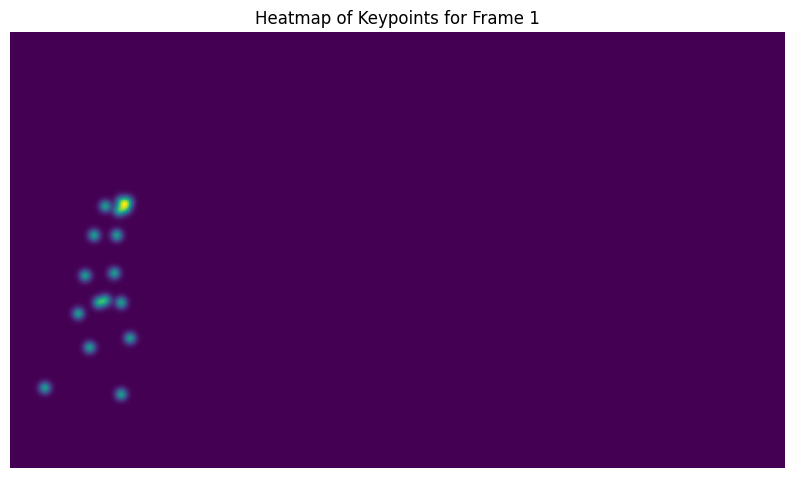

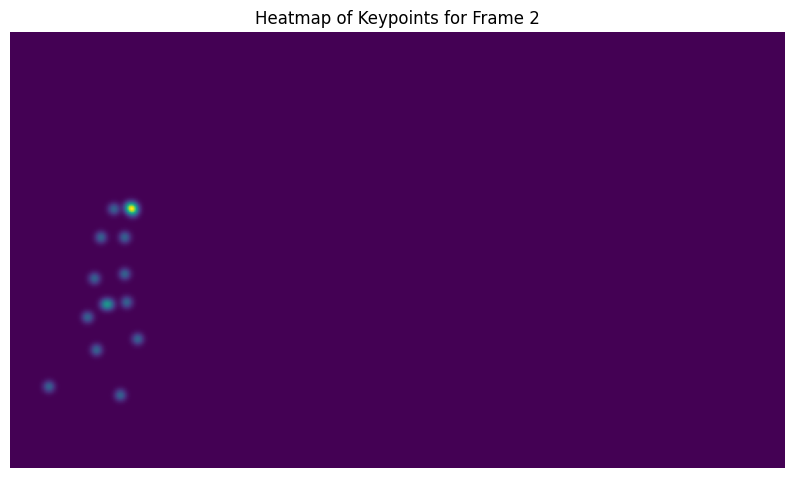

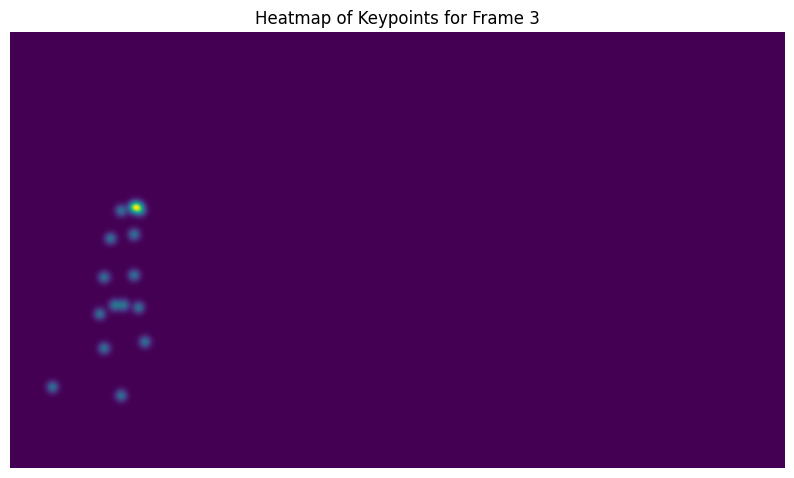

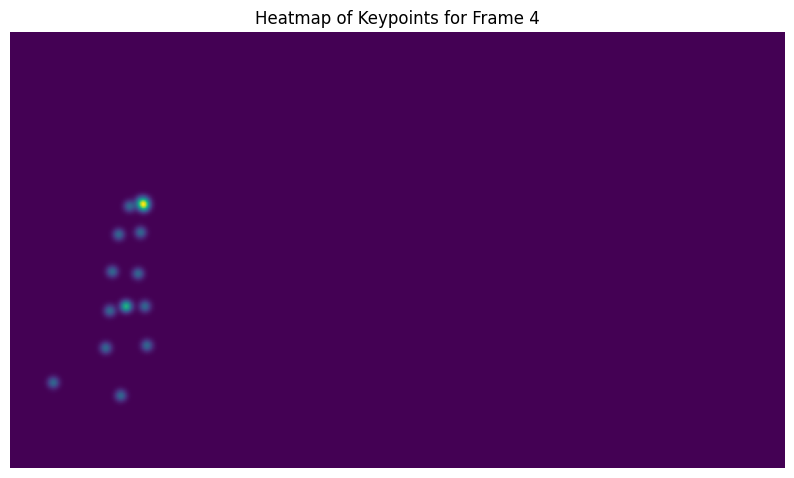

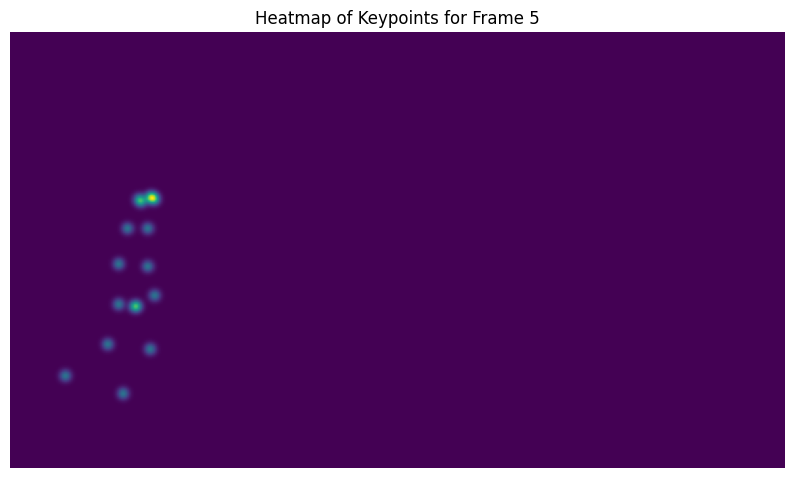

...

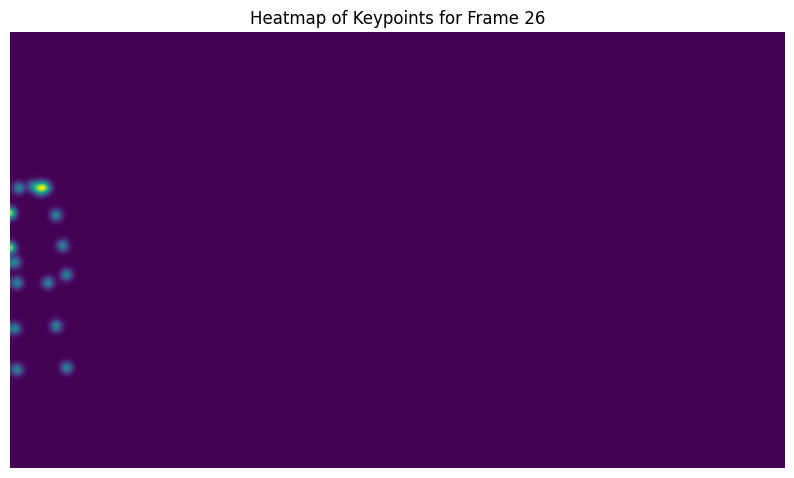

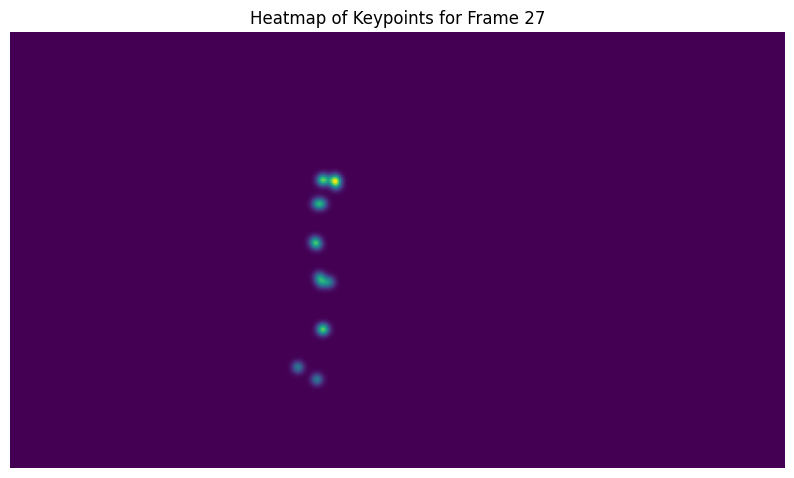

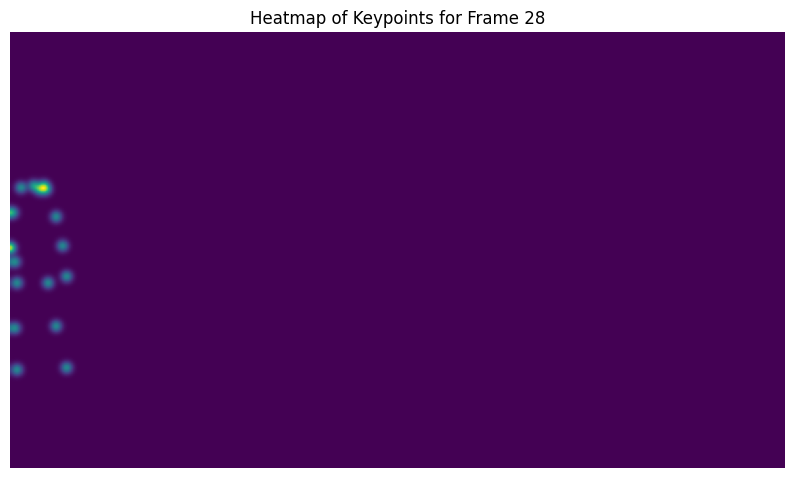

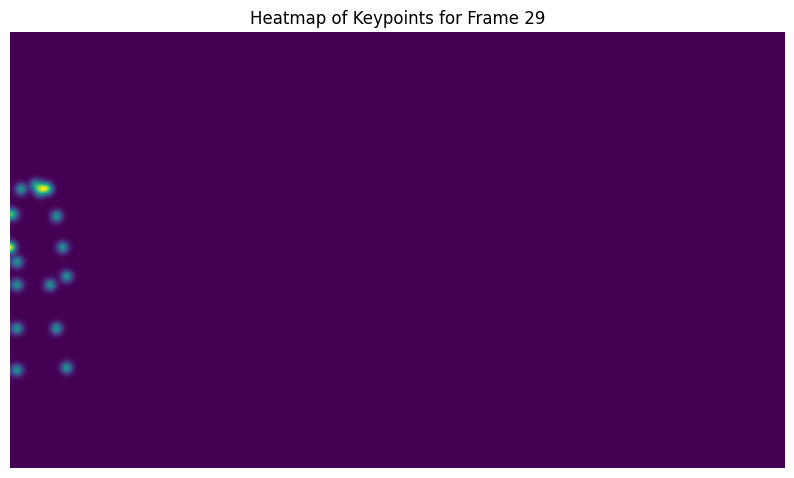

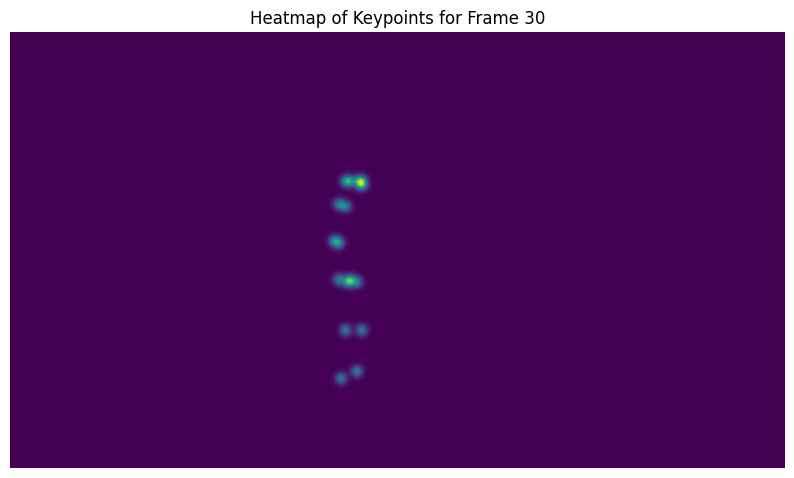

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

for frame_index in range(len(data['keypoint'][0])):
    keypoints = data['keypoint'][0][frame_index]  


    heatmap = np.zeros(data['img_shape'][:2])


    spread = 10  
    for joint in keypoints:
        x, y = int(joint[0]), int(joint[1])  
        if 0 <= x < heatmap.shape[1] and 0 <= y < heatmap.shape[0]:
            heatmap[y, x] = 1  


    heatmap_blurred = gaussian_filter(heatmap, sigma=spread)


    heatmap_normalized = heatmap_blurred / heatmap_blurred.max()


    plt.figure(figsize=(10, 10))
    plt.imshow(heatmap_normalized, interpolation='nearest')
    plt.title(f'Heatmap of Keypoints for Frame {frame_index + 1}')
    plt.axis('off')
    plt.show()